In [5]:
import fileprocessing
import multianalysis
import matplotlib.pyplot as plt
import cooltools
import cooltools.eigdecomp as eigdecomp
import numpy as np
from importlib import reload
import HMMC
# import coolplots
import bedutils
import numutils
from multiprocessing import Pool
import itertools
import triangular

SyntaxError: invalid syntax (bedutils.py, line 1)

In [1]:
cooldir = '/pollard/data/chromatin_organization/rao2014/distiller-0.3.1_hg19/results'

In [6]:
cools = fileprocessing.get_files(cooldir)

In [7]:
df = fileprocessing.cools_df(cools, resolution = 100000)
df

,cell_line,assembly,path,cooler
0,NHEK,hg19,/pollard/data/chromatin_organization/rao2014/d...,"<Cooler ""NHEK_inSitu_MboI.hg19.mapq_30.1000.mc..."
1,IMR90,hg19,/pollard/data/chromatin_organization/rao2014/d...,"<Cooler ""IMR90_inSitu_MboI.hg19.mapq_30.1000.m..."
2,K562,hg19,/pollard/data/chromatin_organization/rao2014/d...,"<Cooler ""K562_inSitu_MboI.hg19.mapq_30.1000.mc..."
3,HUVEC,hg19,/pollard/data/chromatin_organization/rao2014/d...,"<Cooler ""HUVEC_inSitu_MboI.hg19.mapq_30.1000.m..."
4,HMEC,hg19,/pollard/data/chromatin_organization/rao2014/d...,"<Cooler ""HMEC_inSitu_MboI.hg19.mapq_30.1000.mc..."
5,KBM7,hg19,/pollard/data/chromatin_organization/rao2014/d...,"<Cooler ""KBM7_inSitu_MboI.hg19.mapq_30.1000.mc..."
6,GM12878,hg19,/pollard/data/chromatin_organization/rao2014/d...,"<Cooler ""GM12878_inSitu_MboI.hg19.mapq_30.1000..."


In [5]:
genecov_dict = fileprocessing.get_genecov(df)

In [6]:
#GM12878
vals, tracks = multianalysis.get_eigs(df.iloc[6:], genecov_dict, n = 3)

In [7]:
tracks[0].chrom.unique()

[chr1, chr2, chr3, chr4, chr5, ..., chr21, chr22, chrX, chrY, chrM]
Length: 25
Categories (25, object): [chr1 < chr2 < chr3 < chr4 ... chr22 < chrX < chrY < chrM]

In [8]:
reload(HMMC)

<module 'HMMC' from '/pollard/home/lchumpitaz/Hi-C/testing/HMMC.py'>

In [9]:
hmm_track = HMMC.auto_analyze(tracks[0])

Fitting a model with 34 free scalar parameters with only 29 data points will result in a degenerate solution.
Fitting a model with 47 free scalar parameters with only 29 data points will result in a degenerate solution.


[ 2. -2.  2. ...  3.  0.  0.]


In [10]:
reload(coolplots)

<module 'coolplots' from '/pollard/home/lchumpitaz/Hi-C/testing/coolplots.py'>

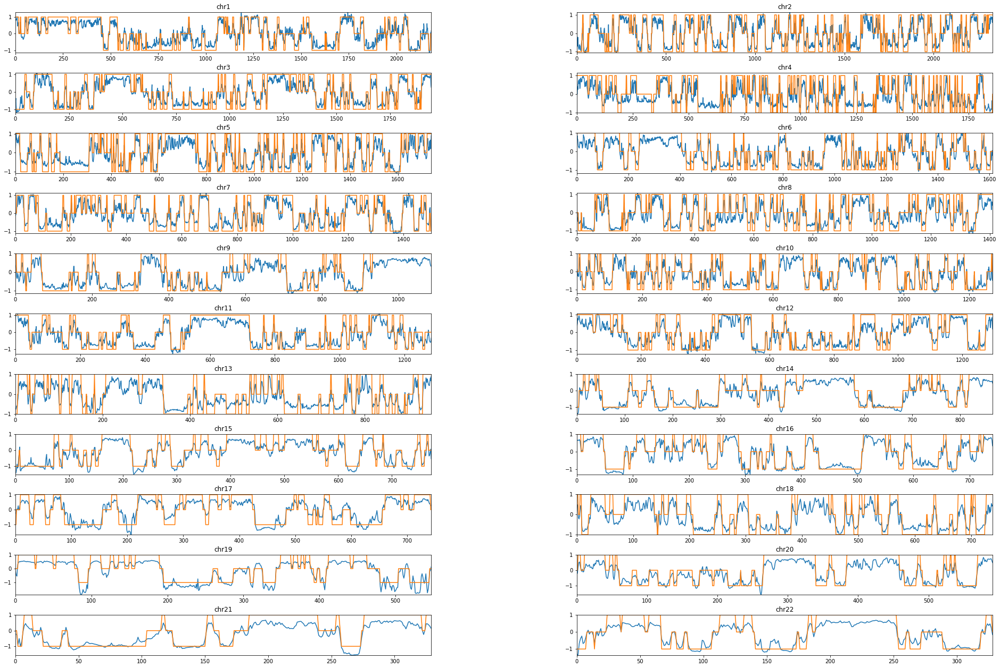

In [11]:
coolplots.plot_chroms(hmm_track, 'E1', 'HMM3')

In [12]:
hmm_track

,chrom,start,end,weight,gene_count,E1,E2,E3,binary,HMM2,HMM3,HMM4,HMM5,HMM6,HMM5_2
0,chr1,0,100000,NaN,0.227420,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,chr1,100000,200000,NaN,0.423960,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,chr1,200000,300000,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,chr1,300000,400000,NaN,0.462310,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,chr1,400000,500000,NaN,0.071590,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30966,chrY,59000000,59100000,0.013027,0.290520,-0.729549,0.160423,0.43213,0.0,1.0,2.0,3.0,4.0,5.0,4.0
30967,chrY,59100000,59200000,NaN,0.134630,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
30968,chrY,59200000,59300000,NaN,0.628610,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
30969,chrY,59300000,59373566,NaN,0.342536,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [39]:
reload(coolplots)
fig1 = coolplots.plot_map_plotly(df.iloc[6].cooler, hmm_track, chrom = 'chr1', signal= "binary")

In [40]:
fig1.show(config={'doubleClick': 'reset', 'toImageButtonOptions': {'width':600, 'height':600, 'scale':2}})

In [37]:
fig2 = coolplots.plot_map_plotly(df.iloc[6].cooler, hmm_track, chrom = 'chr19', signal= "binary")

In [38]:
fig2.show(config={'doubleClick': 'reset', 'toImageButtonOptions': {'width':600, 'height':600, 'scale':2}})